In [151]:
import numpy as np
import cv2
import matplotlib.pyplot as plt
%matplotlib.pyplot inline

UsageError: Line magic function `%matplotlib.pyplot` not found.


In [152]:
def get_homograph(u,v):
    A = np.array([[u[0][0], u[0][1], 1, 0, 0, 0, -1 * u[0][0] * v[0][0], -1 * u[0][1] * v[0][0]],
                  [0, 0, 0, u[0][0], u[0][1], 1, -1 * u[0][0] * v[0][1], -1 * u[0][1] * v[0][1]],
                  [u[1][0], u[1][1], 1, 0, 0, 0, -1 * u[1][0] * v[1][0], -1 * u[1][1] * v[1][0]],
                  [0, 0, 0, u[1][0], u[1][1], 1, -1 * u[1][0] * v[1][1], -1 * u[1][1] * v[1][1]],
                  [u[2][0], u[2][1], 1, 0, 0, 0, -1 * u[2][0] * v[2][0], -1 * u[2][1] * v[2][0]],
                  [0, 0, 0, u[2][0], u[2][1], 1, -1 * u[2][0] * v[2][1], -1 * u[2][1] * v[2][1]],
                  [u[3][0], u[3][1], 1, 0, 0, 0, -1 * u[3][0] * v[3][0], -1 * u[3][1] * v[3][0]],
                  [0, 0, 0, u[3][0], u[3][1], 1, -1 * u[3][0] * v[3][1], -1 * u[3][1] * v[3][1]]
                ])
    
    b = np.array([[v[0][0]],
                  [v[0][1]],
                  [v[1][0]],
                  [v[1][1]],
                  [v[2][0]],
                  [v[2][1]],
                  [v[3][0]],
                  [v[3][1]]
                ])
    
    tmp = np.dot(np.linalg.inv(A), b)
    
    H = np.array([[tmp[0][0], tmp[1][0], tmp[2][0]],
                  [tmp[3][0], tmp[4][0], tmp[5][0]],
                  [tmp[6][0], tmp[7][0], 1]
                 ])
    
    return H

In [153]:
def interpolation(img, new_x, new_y):
    fx = round(new_x - int(new_x), 2)
    fy = round(new_y - int(new_y), 2)

    p = np.zeros((3,))
    p += (1 - fx) * (1 - fy) * img[int(new_y), int(new_x)]
    p += (1 - fx) * fy * img[int(new_y) + 1, int(new_x)]
    p += fx * (1 - fy) * img[int(new_y), int(new_x) + 1]
    p += fx * fy * img[int(new_y) + 1, int(new_x) + 1]

    return p

## 1. Import Data

In [169]:
screen_corner1 = np.load('1.npy')
screen_corner2 = np.load('2.npy')

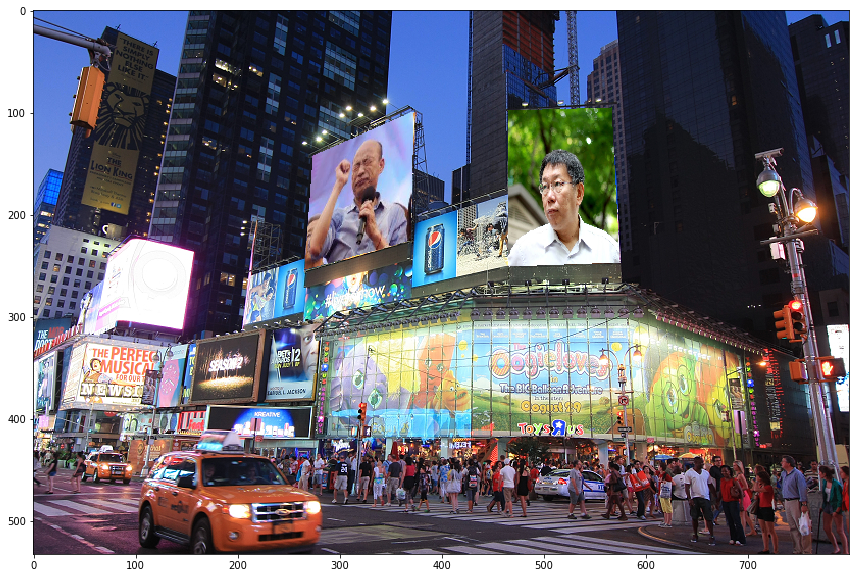

In [170]:
canvas = cv2.imread('TimeSequare.png')
canvas2 = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,10))
plt.imshow(canvas2)

## test-forward wrapping

In [38]:
v = screen_corner2
u = screen_corner1
matrix = get_homograph(u,v) # v: output, u: input

In [39]:
matrix

array([[ 3.25259508e+00,  1.51874775e-01, -1.27601418e+02],
       [ 1.22477160e+00,  2.35300262e+00, -5.05760553e+02],
       [ 2.53123486e-03, -2.69730033e-05,  1.00000000e+00]])

In [40]:
screen_corner1
# h: 254-100=154
# w: 373-267=106

array([[275, 143],
       [373, 100],
       [267, 254],
       [370, 225]])

In [41]:
input_image = canvas

for i in range(154):
    for j in range(106):
        tmp2 = np.dot(matrix, np.array([[j+267, i+100, 1]]).T)
        x, y = int(tmp2[0][0] / tmp2[2][0]), int(tmp2[1][0] / tmp2[2][0])
        canvas[y][x] = input_image[i+100][j+267]

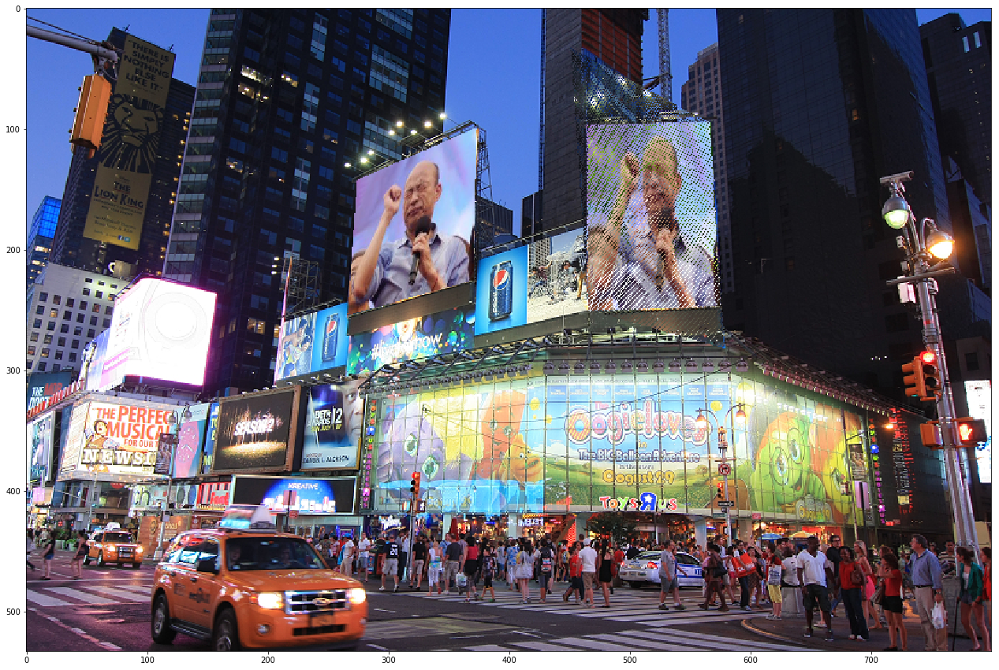

In [42]:
canvas2 = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(30,15))
plt.imshow(canvas2)

## test-backward wrapping

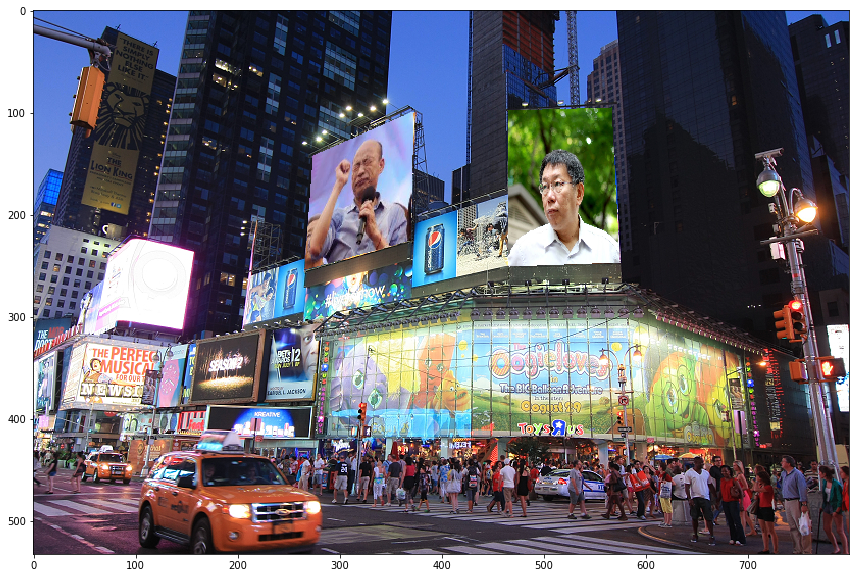

In [139]:
canvas = cv2.imread('TimeSequare.png')
canvas2 = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,10))
plt.imshow(canvas2)

In [140]:
v = screen_corner1
u = screen_corner2
matrix = get_homograph(u,v) # v: input, u: output

In [141]:
screen_corner2
# h: 251-96=155
# w: 575-466=109

array([[466,  99],
       [567,  96],
       [467, 251],
       [575, 247]])

In [142]:
for y in range(155):
    for x in range(109):
        new_pos = np.dot(matrix, np.array([[x+466, y+96, 1]]).T)
        new_x, new_y = new_pos[0][0] / new_pos[2][0], new_pos[1][0] / new_pos[2][0]
        res = interpolation(canvas, new_x, new_y)
        canvas[y+96][x+466] = res

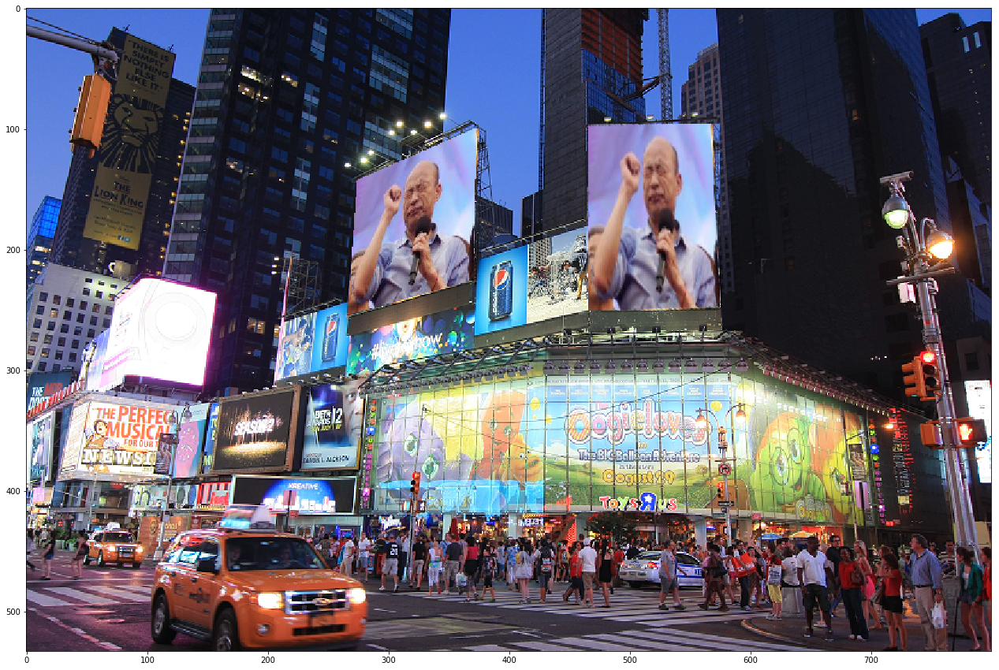

In [143]:
canvas2 = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(30,15))
plt.imshow(canvas2)

## 2. Forward Wrapping
### 2.1 Put picture of Han to KP position

In [171]:
v = screen_corner2
u = screen_corner1
matrix = get_homograph(u,v) # v: output, u: input

In [172]:
screen_corner1
# h: 254-100=154
# w: 373-267=106

array([[275, 143],
       [373, 100],
       [267, 254],
       [370, 225]])

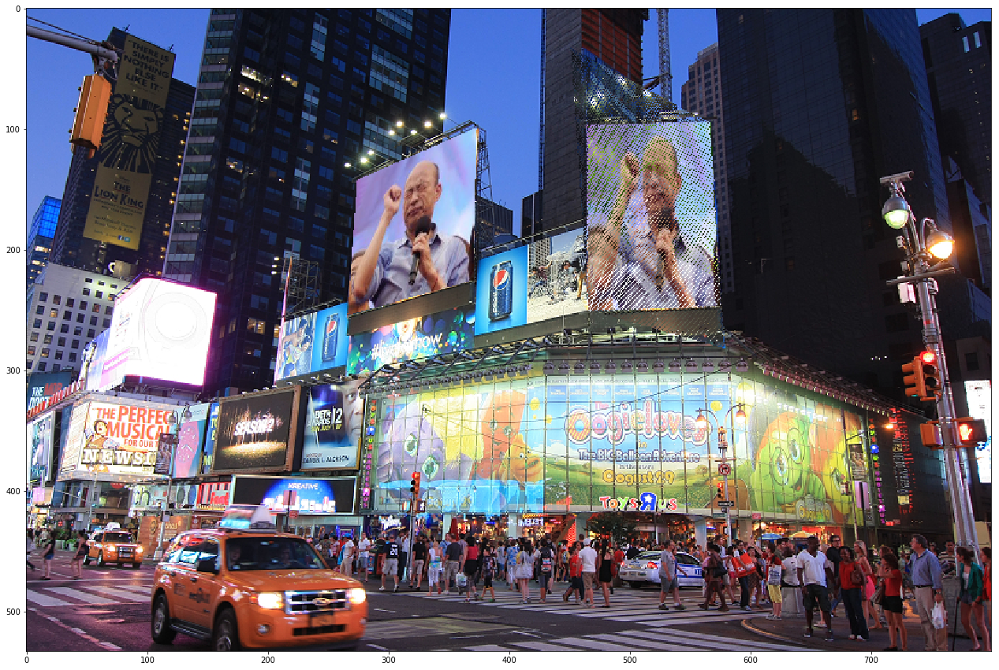

In [173]:
for i in range(154):
    for j in range(106):
        tmp2 = np.dot(matrix, np.array([[j+267, i+100, 1]]).T)
        x, y = int(tmp2[0][0] / tmp2[2][0]), int(tmp2[1][0] / tmp2[2][0])
        canvas[y][x] = input_image[i+100][j+267]

canvas2 = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(30,15))
plt.imshow(canvas2)

### 2.1 Put picture of KP to Han position

In [174]:
v = screen_corner1
u = screen_corner2
matrix = get_homograph(u,v) # v: output, u: input

In [175]:
screen_corner2
# h: 251-96=155
# w: 575-466=109

array([[466,  99],
       [567,  96],
       [467, 251],
       [575, 247]])

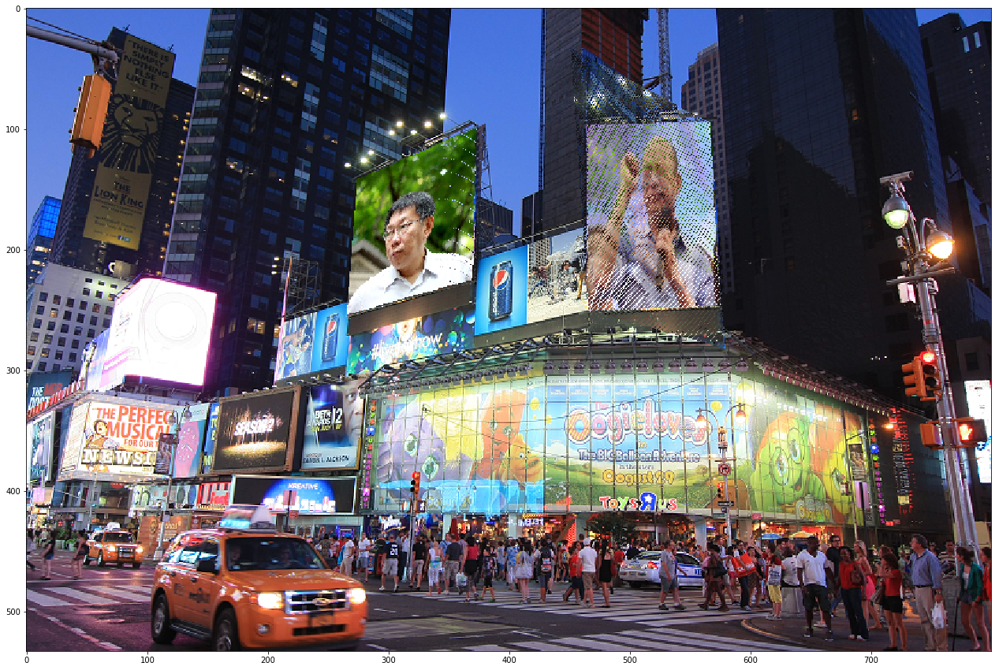

In [176]:
input_image = cv2.imread('TimeSequare.png')
for i in range(155):
    for j in range(109):
        tmp2 = np.dot(matrix, np.array([[j+466, i+96, 1]]).T)
        x, y = int(tmp2[0][0] / tmp2[2][0]), int(tmp2[1][0] / tmp2[2][0])
        canvas[y][x] = input_image[i+96][j+466]

canvas2 = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(30,15))
plt.imshow(canvas2)

## 3. Backward Wrapping
### 3.1 Put picture of Han to KP position

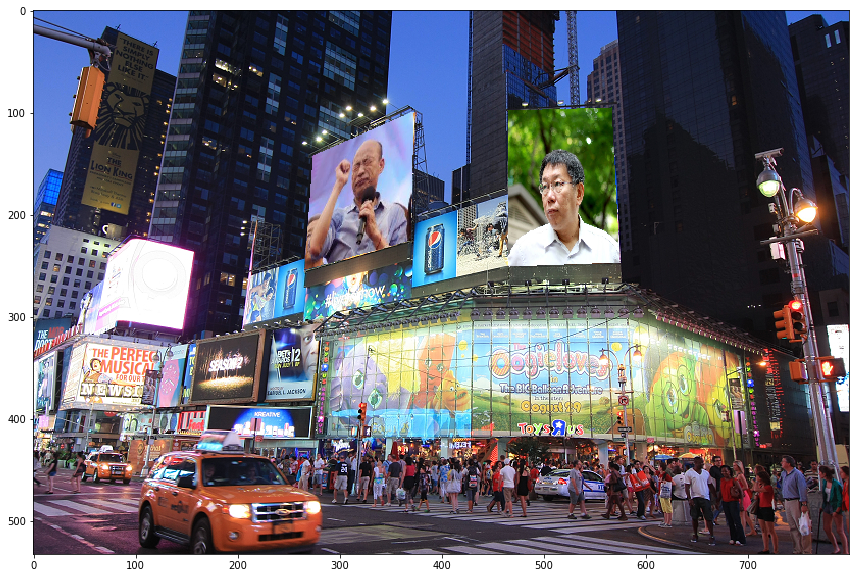

In [181]:
canvas2 = cv2.imread('TimeSequare.png')
canvas3 = cv2.cvtColor(canvas2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(20,10))
plt.imshow(canvas3)

In [182]:
v = screen_corner1
u = screen_corner2
matrix = get_homograph(u,v) # v: input, u: output

In [183]:
screen_corner2
# h: 251-96=155
# w: 575-466=109

array([[466,  99],
       [567,  96],
       [467, 251],
       [575, 247]])

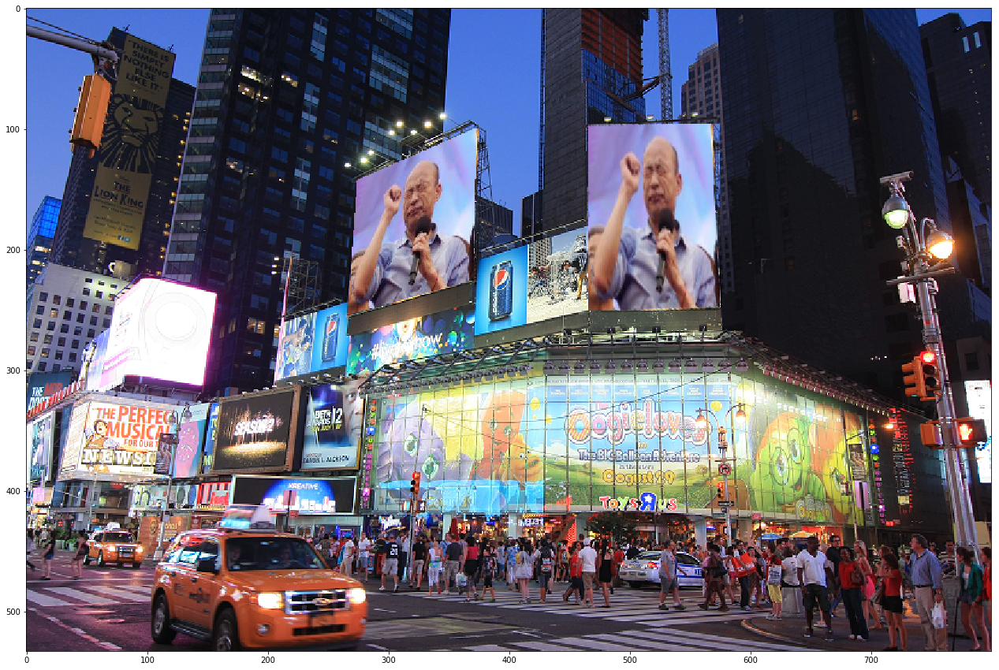

In [184]:
for y in range(155):
    for x in range(109):
        new_pos = np.dot(matrix, np.array([[x+466, y+96, 1]]).T)
        new_x, new_y = new_pos[0][0] / new_pos[2][0], new_pos[1][0] / new_pos[2][0]
        res = interpolation(canvas2, new_x, new_y)
        canvas2[y+96][x+466] = res
        
canvas3 = cv2.cvtColor(canvas2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(30,15))
plt.imshow(canvas3)

### 3.2 Put picture of KP to Han position

In [185]:
v = screen_corner2
u = screen_corner1
matrix = get_homograph(u,v) # v: input, u: output

In [186]:
screen_corner1
# h: 254-100=154
# w: 373-267=106

array([[275, 143],
       [373, 100],
       [267, 254],
       [370, 225]])

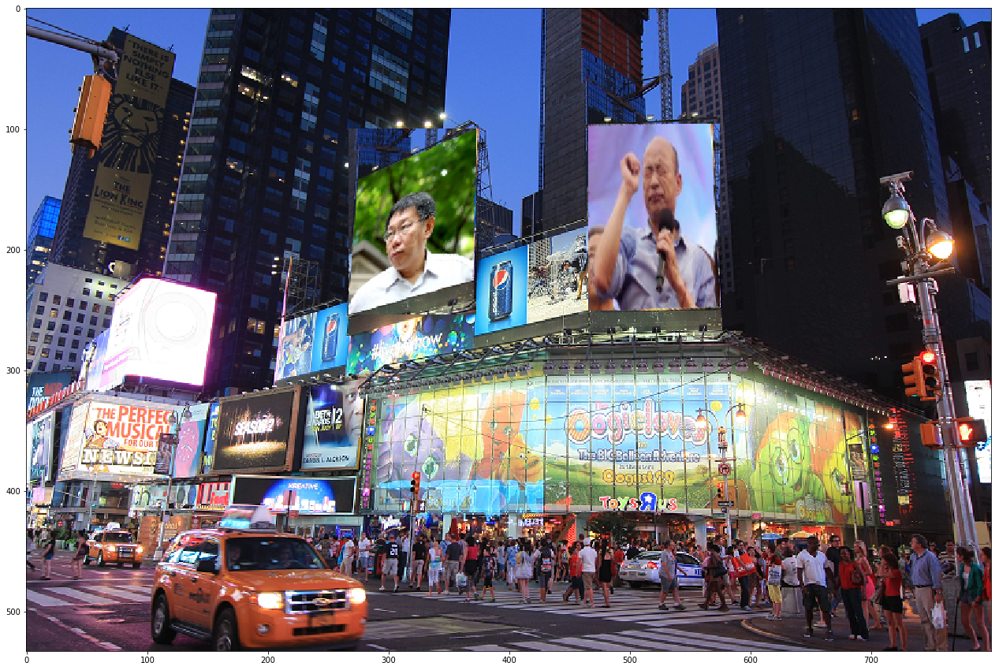

In [187]:
input_image = cv2.imread('TimeSequare.png')
for y in range(154):
    for x in range(106):
        new_pos = np.dot(matrix, np.array([[x+267, y+100, 1]]).T)
        new_x, new_y = new_pos[0][0] / new_pos[2][0], new_pos[1][0] / new_pos[2][0]
        res = interpolation(input_image, new_x, new_y)
        canvas2[y+100][x+267] = res
        
canvas3 = cv2.cvtColor(canvas2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(30,15))
plt.imshow(canvas3)

## Result

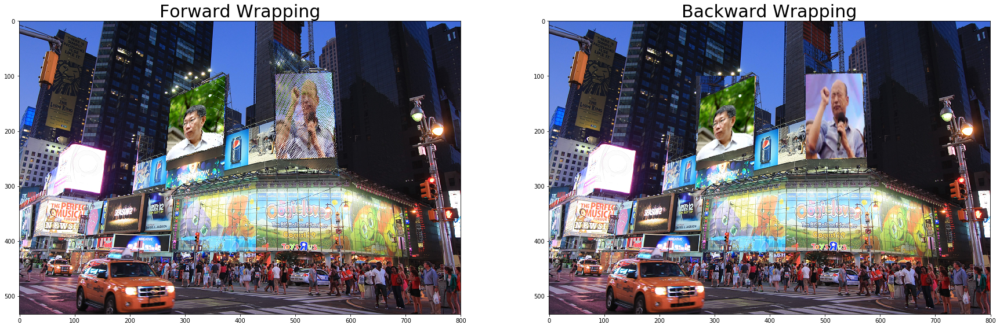

In [193]:
canvas22 = cv2.cvtColor(canvas, cv2.COLOR_BGR2RGB)
canvas33 = cv2.cvtColor(canvas2, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(30,15))
plt.subplot(1,2,1)
plt.title('Forward Wrapping',size=30)
plt.imshow(canvas22)
plt.subplot(1,2,2)
plt.title('Backward Wrapping',size=30)
plt.imshow(canvas33)